# PROJET 6: Classifiez automatiquement des biens de consommation

### Contexte

- L’entreprise "Place de marché”, souhaite lancer une marketplace e-commerce. Sur la place de marché, des vendeurs proposent des articles à des acheteurs en postant une photo et une description.

- Pour l'instant, l'attribution de la catégorie d'un article est effectuée manuellement par les vendeurs, et est donc peu fiable. De plus, le volume des articles est pour l’instant très petit.

- Pour rendre l’expérience utilisateur des vendeurs (faciliter la mise en ligne de nouveaux articles) et des acheteurs (faciliter la recherche de produits) la plus fluide possible, et dans l'optique d'un passage à l'échelle, il devient nécessaire d'automatiser cette tâche.

#### PARTIE 2 : Données "IMAGES"

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from sklearn import metrics
from sklearn import cluster
from sklearn import preprocessing
from sklearn.cluster import  KMeans
from sklearn import manifold, decomposition
from matplotlib.image import imread
import cv2 as cv
import keras
from keras.preprocessing import image
from keras.models import Model
from PIL import Image, ImageOps ,ImageFilter
from tensorflow.python.keras.layers import Flatten
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

2023-05-29 12:29:20.833790: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
data=pd.read_csv("dfP6.csv")

In [4]:
data.head(3)

,uniq_id,product_name,image,description,brand,categ_1,categ_2,categ_3
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,key feature elegance polyester multicolor abst...,Elegance,Home Furnishing,Curtains & Accessories,Curtains
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,specification sathiyas cotton bath towel 3 bat...,Sathiyas,Baby Care,Baby Bath & Skin,Baby Bath Towels
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,key feature eurospa cotton terry face towel se...,Eurospa,Baby Care,Baby Bath & Skin,Baby Bath Towels


In [5]:
# Ajout variable image_loc
Accees = "./Images/"
data['image_loc'] = [Accees + row for row in data['image']]

In [6]:
df_img= data[["description", "product_name", "image", "image_loc", "categ_1"]]
df_img.head(3)

,description,product_name,image,image_loc,categ_1
0,key feature elegance polyester multicolor abst...,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,./Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing
1,specification sathiyas cotton bath towel 3 bat...,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,./Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care
2,key feature eurospa cotton terry face towel se...,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,./Images/64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care


In [7]:
data_cate = df_img.groupby('categ_1').agg({'image' : 'count'})
data_cate

,image
categ_1,
Baby Care,150
Beauty and Personal Care,150
Computers,150
Home Decor & Festive Needs,150
Home Furnishing,150
Kitchen & Dining,150
Watches,150


##### Affichage d'exemples d'images par label

Home Furnishing


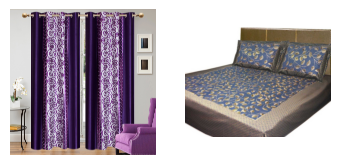

Baby Care


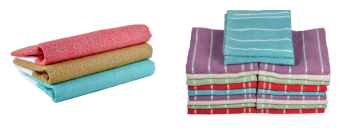

Watches


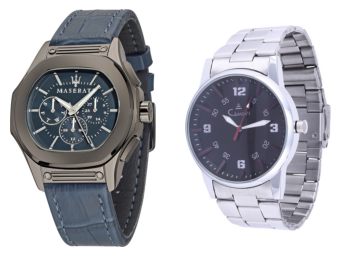

Home Decor & Festive Needs


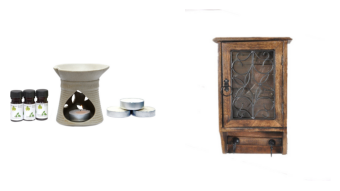

Kitchen & Dining


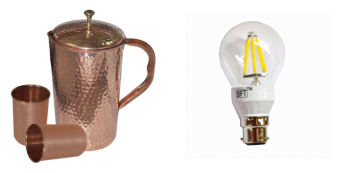

Beauty and Personal Care


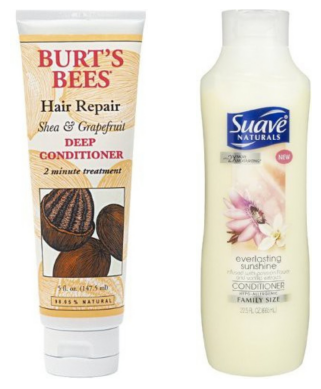

Computers


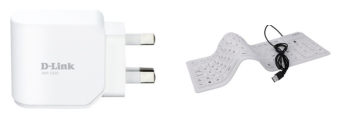

In [8]:
# affichage des images 
for j, categ in enumerate(data["categ_1"].unique()) :
    bolded_string = "\033[1m" + categ + "\033[0m"
    print(bolded_string)
    # print("-------")
    for i in range(2):
        name_image = data[data["categ_1"] == categ]["image"].iloc[i]
        plt.subplot(130 + 1 + i)
        filename = Accees + name_image
        img = imread(filename)
        plt.imshow(img)
        plt.axis('off')    
    plt.show()    

In [9]:
# Déscription des images 

# Largeur des images
df_img['Largeur_img'] = [Image.open(row).size[0] for row in df_img['image_loc']]
# Hauteur des images
df_img['Hauteur_img'] = [Image.open(row).size[1] for row in df_img['image_loc']]
# Taille des images
df_img['Taille_img'] = [(Image.open(row).size[0] * Image.open(row).size[1])
                      for row in df_img['image_loc']]
# Format des images
df_img['Format_img'] = [Image.open(row).mode for row in df_img['image_loc']]
df_img.head(3)

/Users/sbeddyy/anaconda3/envs/Projet6/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/var/folders/60/hb75r86s6q32cwlq2m29fbkm0000gn/T/ipykernel_859/3843841727.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_img['Largeur_img'] = [Image.open(row).size[0] for row in df_img['image_loc']]
/Users/sbeddyy/anaconda3/envs/Projet6/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/var/folders/60/hb75r86s6q32cwlq2m29fbkm0000gn/T/ipykernel_859/3843841727.py:6: Setti

,description,product_name,image,image_loc,categ_1,Largeur_img,Hauteur_img,Taille_img,Format_img
0,key feature elegance polyester multicolor abst...,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,./Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,3600,3600,12960000,RGB
1,specification sathiyas cotton bath towel 3 bat...,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,./Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,2388,1293,3087684,RGB
2,key feature eurospa cotton terry face towel se...,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,./Images/64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,982,729,715878,RGB


#### Pré-traitement des images

Cette étape vise à améliorer la qualité de l'image et à réduire le bruit indésirable. Les opérations courantes incluent le redimensionnement, le filtrage, la correction des couleurs, la normalisation de luminosité/contraste, etc.

- images pour tester les procédures de prétraitement

In [10]:
def image_histopixel(image, titre):
    '''
    Afficher côte à côte l'image et l'histogramme de répartiton des pixels.
    Parameters
    '''
    plt.figure(figsize=(40, 10))
    plt.subplot(131)
    plt.title(titre, fontsize=30)
    plt.imshow(image, cmap='gray')
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.subplot(132)
    plt.title('Histogramme de répartition des pixels', fontsize=30)
    hist, bins = np.histogram(np.array(image).flatten(), bins=256)
    plt.bar(range(len(hist[0:255])), hist[0:255])
    plt.xlabel('Niveau de gris', fontsize=30)
    plt.ylabel('Nombre de pixels', fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.subplot(133)
    plt.title('Histogramme cumulé des pixels', fontsize=30)
    plt.hist(np.array(image).flatten(), bins=range(256), cumulative=True)
    plt.xlabel('Niveau de gris', fontsize=24)
    plt.ylabel('Fréquence cumulée de pixels', fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.show()

In [11]:
dim = (224, 224)

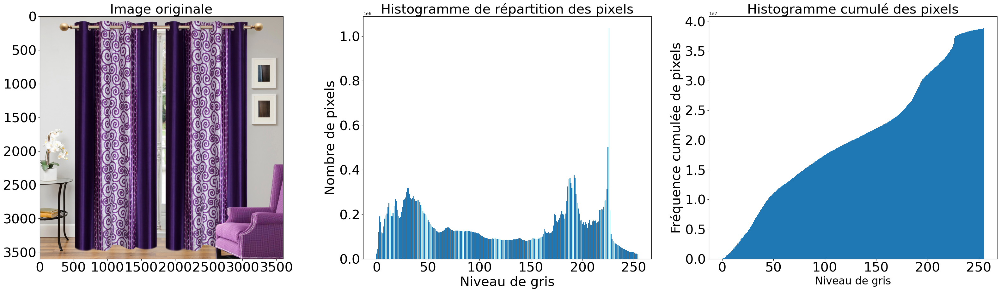

In [12]:
img_orig = Image.open('./Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg')
image_histopixel(img_orig, 'Image originale')

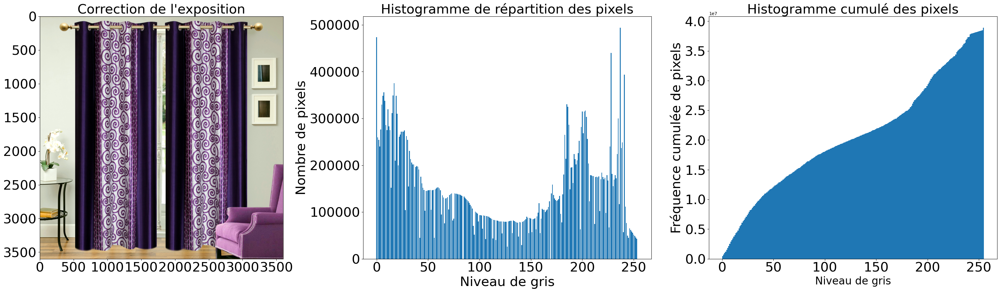

In [13]:
# Correction de l'exposition PILS
img_expo = ImageOps.autocontrast(img_orig, 1)
image_histopixel(img_expo, 'Correction de l\'exposition')

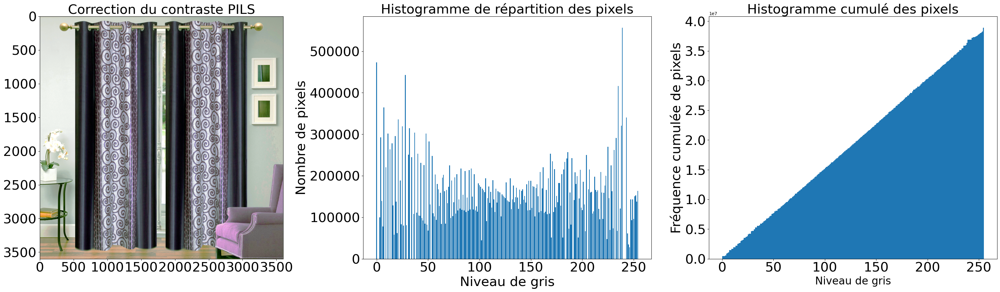

In [14]:
# Correction du contraste PILS
img_contr_pils = ImageOps.equalize(img_expo)
image_histopixel(img_contr_pils,'Correction du contraste PILS')

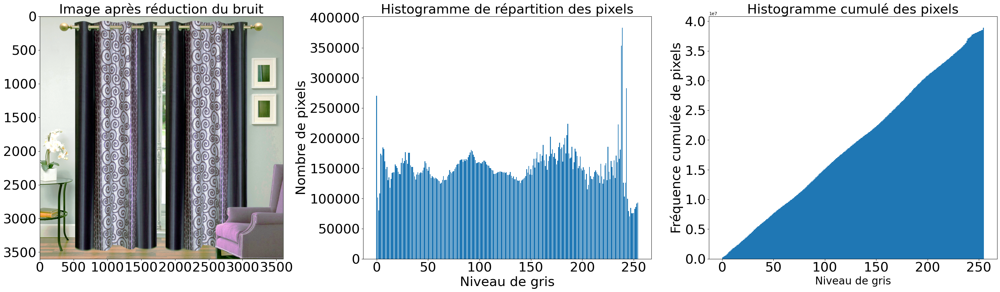

In [15]:
# Réduction du bruit (filtre)
img_filter = img_contr_pils.filter(ImageFilter.BoxBlur(1))
image_histopixel(img_filter,'Image après réduction du bruit')

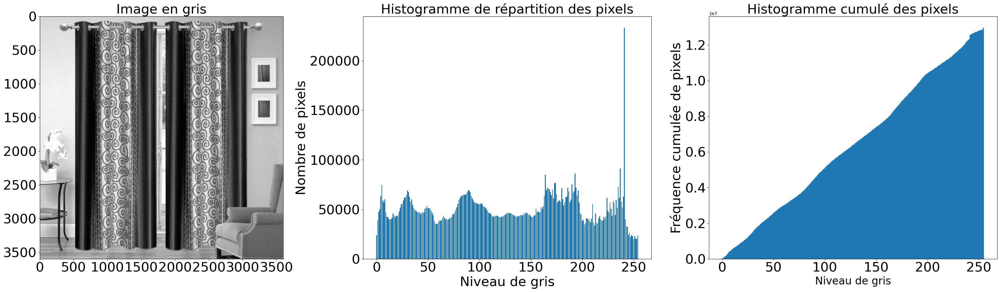

In [16]:
# Conversion de l'image en niveau de gris pour SIFT
img_gris = cv.cvtColor(np.array(img_filter), cv.COLOR_RGB2GRAY)
image_histopixel(img_gris,'Image en gris')

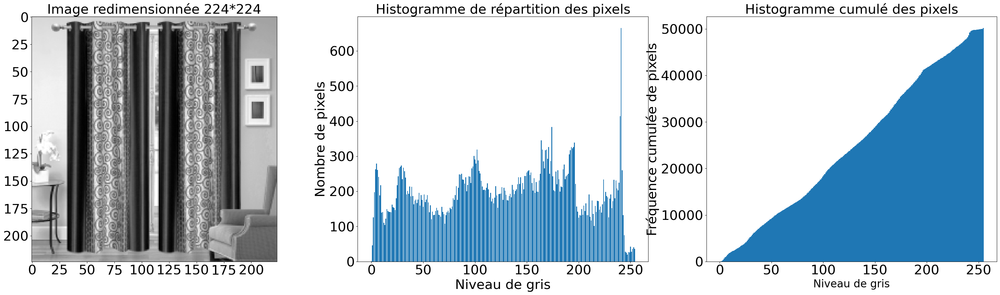

In [17]:
# Redimensionnement image contraste PILS
img_redim_pils = cv.resize(np.array(img_gris), dim,
                            interpolation=cv.INTER_AREA)
image_histopixel(img_redim_pils,'Image redimensionnée 224*224')

- prétraitement tous les images

In [18]:
import os
def preprocess_images(image):
   

     # Définition d'une taille cible de l'image après redimensionnement
    dim = (224, 224)
    #dir_images_transformed = './Images/Images_process/'
    
    # nom de fichier à l'aide de la fonction "os.path.split".
    file_dir = os.path.split(image)

    # Chargement de l'image à l'aide de la bibliothèque PIL 
    img = Image.open(image)

    # Correction de l'exposition PILS (étirement de l'histogramme)
    img = ImageOps.autocontrast(img, 1)

    # Correction du contraste (égalisation de l'histogramme)
    img = ImageOps.equalize(img)
    
    # Réduction du bruit 
    img = img.filter(ImageFilter.BoxBlur(1))
    
    # Conversion en niveau de gris de l'image
    img = cv.cvtColor(np.array(img), cv.COLOR_BGR2GRAY)    
         
    # Redimensionnement, "INTER_AREA" pour maintenir la qualité de l'image.
    img = cv.resize(np.array(img), dim, interpolation=cv.INTER_AREA)

    # Sauvegarde de l'image dans le répertoire data/Images_process
    cv.imwrite('./Images/Image_process/' + file_dir[1], img)

    return './Images/Image_process/' + file_dir[1]

In [19]:
# Pré-traitement de toutes les images
df_img['images_proces'] = df_img['image_loc'].apply(preprocess_images)
df_img.head(3)

/Users/sbeddyy/anaconda3/envs/Projet6/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


,description,product_name,image,image_loc,categ_1,Largeur_img,Hauteur_img,Taille_img,Format_img,images_proces
0,key feature elegance polyester multicolor abst...,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,./Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,3600,3600,12960000,RGB,./Images/Image_process/55b85ea15a1536d46b7190a...
1,specification sathiyas cotton bath towel 3 bat...,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,./Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,2388,1293,3087684,RGB,./Images/Image_process/7b72c92c2f6c40268628ec5...
2,key feature eurospa cotton terry face towel se...,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,./Images/64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,982,729,715878,RGB,./Images/Image_process/64d5d4a258243731dc7bbb1...


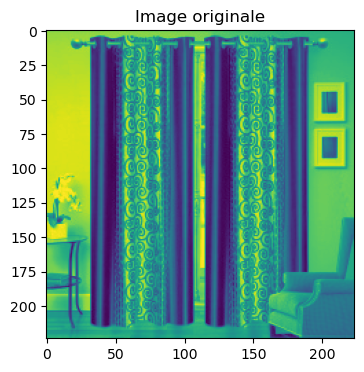

In [20]:
# Chargement de l'image précédemment traitée
img =imread('./Images/Image_process/55b85ea15a1536d46b7190ad6fff8ce7.jpg')
# Visualisation de l'image
plt.figure(figsize=(4, 4))
plt.title('Image originale')
plt.imshow(img)
plt.show()

### Méthode SIFT

La scale-invariant feature transform (SIFT), que l'on peut traduire par « transformation de caractéristiques visuelles invariante à l'échelle », est un algorithme utilisé pour détecter et identifier les éléments similaires entre différentes images numériques (éléments de paysages, objets, personnes, etc.). Il a été développé en 1999.

L'étape fondamentale de la méthode consiste à calculer ce que l'on appelle les « descripteurs SIFT » des images à étudier. Il s'agit d'informations numériques dérivées de l'analyse locale d'une image et qui caractérisent le contenu visuel de cette image de la façon la plus indépendante possible de l'échelle (« zoom » et résolution du capteur), du cadrage, de l'angle d'observation et de l'exposition (luminosité).

Ainsi, deux photographies d'un même objet auront toutes les chances d'avoir des descripteurs SIFT similaires, et ceci d'autant plus si les instants de prise de vue et les angles de vue sont proches.

#### Détermination et affichage des descripteurs SIFT

In [21]:
path='./Images/Image_process/'
from os import listdir
list_photos = [file for file in listdir(path)]
print(len(list_photos))

1050


[ WARN:0@167.117] global /private/var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_5a1v4y7k9y/croot/opencv-suite_1676472757237/work/opencv_contrib-4.6.0/modules/xfeatures2d/misc/python/shadow_sift.hpp (15) SIFT_create DEPRECATED: cv.xfeatures2d.SIFT_create() is deprecated due SIFT tranfer to the main repository. https://github.com/opencv/opencv/issues/16736


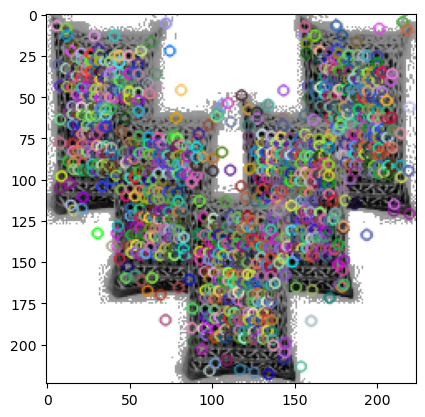

Descripteurs :  (1411, 128)

[[  0.   0.   0. ...   0.   0.   0.]
 [  9.   5.   1. ...   0.   0.   2.]
 [  9.   7. 173. ...   0.   0.  10.]
 ...
 [ 71.  13.   1. ...   0.   0.   0.]
 [  0.   0.  22. ...   0.   0.  43.]
 [ 83.  34.  20. ...   1.   4.   1.]]


In [22]:
import cv2

sift = cv2.xfeatures2d.SIFT_create()
image = cv2.imread(path+list_photos[1],0) # convert in gray
image = cv2.equalizeHist(image)   # equalize image histogram
kp, d = sift.detectAndCompute(image, None)
img=cv2.drawKeypoints(image,kp,image)
plt.imshow(img)
plt.show()
print("Descripteurs : ", d.shape)
print()
print(d)

* L'image contient 1411 descripteurs
* Chaque descripteur est un vecteur de longueur 128

### Créations des descripteurs de chaque image

* Pour chaque image passage en gris et equalisation
* création d'une liste de descripteurs par image ("sift_keypoints_by_img") qui sera utilisée pour réaliser les histogrammes par image
* création d'une liste de descripteurs pour l'ensemble des images ("sift_keypoints_all") qui sera utilisé pour créer les clusters de descripteurs

In [23]:
list_photos=df_img['images_proces']

In [24]:
# identification of key points and associated descriptors
import time, cv2
sift_keypoints = []
temps1=time.time()
sift = cv.xfeatures2d.SIFT_create(500)

for image_num in range(len(list_photos)) :
    if image_num%100 == 0 : print(image_num)
    image = cv.imread(list_photos[image_num],0) # convert in gray
    res = cv.equalizeHist(image)   # equalize image histogram
    kp, des = sift.detectAndCompute(res, None)
    sift_keypoints.append(des)
Data_type = object

sift_keypoints_by_img = np.array(sift_keypoints, dtype=Data_type)
sift_keypoints_all    = np.concatenate(sift_keypoints_by_img, axis=0)

print()
print("Nombre de descripteurs : ", sift_keypoints_all.shape)

duration1=time.time()-temps1
print("temps de traitement SIFT descriptor : ", "%15.2f" % duration1, "secondes")

0
100
200
300
400
500
600
700
800
900
1000

Nombre de descripteurs :  (340095, 128)
temps de traitement SIFT descriptor :             6.54 secondes


### Création des clusters de descripteurs

In [25]:
k = int(round(np.sqrt(len(sift_keypoints_all)),0))

print("Nombre de clusters estimés : ", k)
print("Création de",k, "clusters de descripteurs ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=0)
kmeans.fit(sift_keypoints_all)

Nombre de clusters estimés :  583
Création de 583 clusters de descripteurs ...


MiniBatchKMeans(init_size=1749, n_clusters=583, random_state=0)

### Création des features des images

Pour chaque image :

- Prédiction des numéros de cluster de chaque descripteur
- création d'un histogramme = comptage pour chaque numéro de cluster du nombre de descripteurs de l'image

Features d'une image = Histogramme d'une image = Comptage pour une image du nombre de descripteurs par cluster

In [26]:
# Création d'histogrammes (features)
temps1=time.time()

def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist


# Création de matrice d'histogrammes
hist_vectors=[]

for i, image_desc in enumerate(sift_keypoints_by_img) :
    if i%100 == 0 : print(i)  
    hist = build_histogram(kmeans, image_desc, i) #calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

duration1=time.time()-temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")

0
100
200
300
400
500
600
700
800
900
1000
temps de création histogrammes :             3.43 secondes


### Réductions de dimension

* PCA

La réduction PCA permet de créer des features décorrélées entre elles, et de diminuer leur dimension, tout en gardant un niveau de variance expliquée élevé (99%)

In [27]:
print("Dimensions dataset avant réduction PCA : ", im_features.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_img= pca.fit_transform(im_features)
print("Dimensions dataset après réduction PCA : ", pca_results_img.shape)

Dimensions dataset avant réduction PCA :  (1050, 583)
Dimensions dataset après réduction PCA :  (1050, 477)


* TSN-E

Réduction de dimension en 2 composantes T-SNE pour affichage en 2D des images

In [28]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=0)
tsne_results_img = tsne.fit_transform(pca_results_img)

df_tsne_img = pd.DataFrame(tsne_results_img[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_img["class"] = df_img["categ_1"]
print(df_tsne_img.shape)

(1050, 3)


* Analyse visuelle

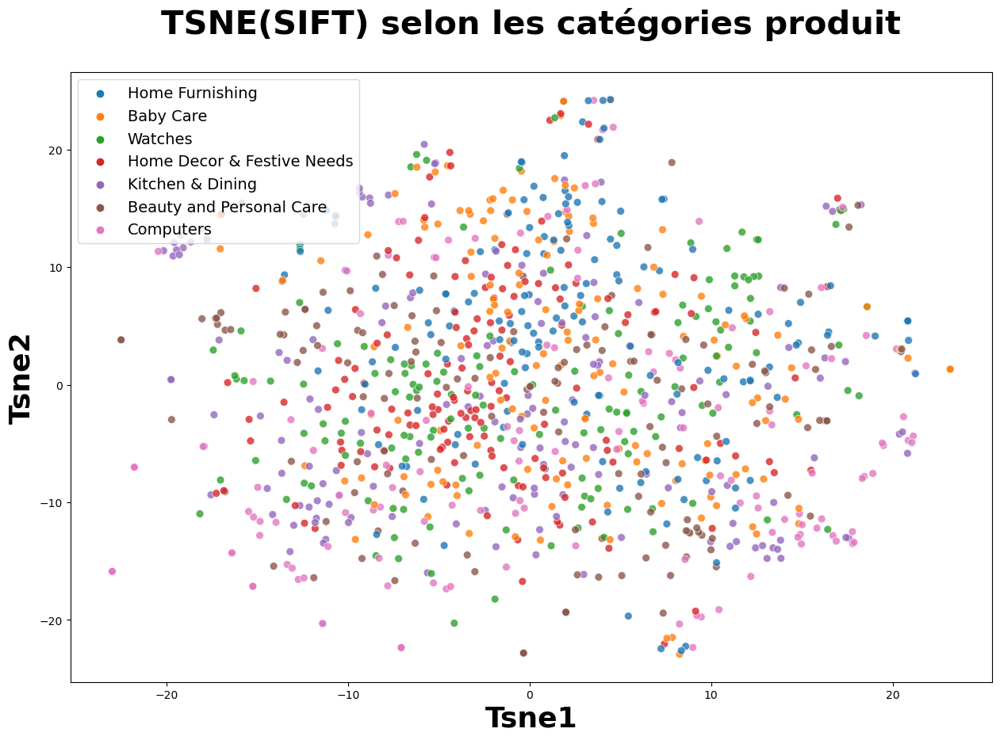

In [29]:
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_img, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE(SIFT) selon les catégories produit', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('Tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('Tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

* Analyse mesures : similarité entre catégories et clusters

In [30]:
X = df_tsne_img[["tsne1","tsne2"]]

cls = KMeans(n_clusters=7, init='k-means++', random_state=0)
cls.fit(X)

df_tsne_img["cluster"] = cls.labels_

print(df_tsne_img.shape)

(1050, 4)


-- Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters

In [31]:
# Création des labels à partir du nom de catégorie produit
le = preprocessing.LabelEncoder()
df_img["label"] = le.fit_transform(df_img["categ_1"])
le_name_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print(le_name_mapping)

{'Baby Care': 0, 'Beauty and Personal Care': 1, 'Computers': 2, 'Home Decor & Festive Needs': 3, 'Home Furnishing': 4, 'Kitchen & Dining': 5, 'Watches': 6}


In [32]:
# Création des labels à partir du nom de catégory produit
df_img["label"] = le.fit_transform(df_img["categ_1"])

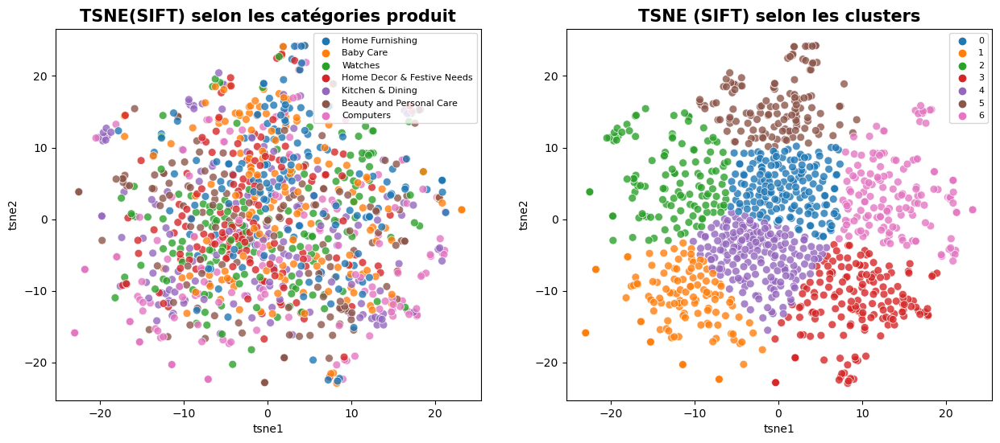

---------------------------
ARI :  0.034999310438367515
---------------------------


In [33]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(121)
    

sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_img, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE(SIFT) selon les catégories produit', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 



ax = fig.add_subplot(122)
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_img,
    legend="brief")

plt.title('TSNE (SIFT) selon les clusters', fontsize =15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 

plt.show()


print("---------------------------")
labels = df_img["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))
print("---------------------------")

* Analyse par classes

la matrice de confusion

In [34]:
# Affiche la matrice de confusion

def confusion_matrix(y_true, y_pred, title):
    """ xxx
    Args:
        y_true list(str):
        y_pred list(int):
        title (str): 
    Returns:
        -
    """
    # Create a DataFrame with labels and varieties as columns: df
    df = pd.DataFrame({'Labels': y_true, 'Clusters': y_pred})

    # Create crosstab: ct
    ct = pd.crosstab(df['Labels'], df['Clusters'])

    # plot the heatmap for correlation matrix
    fig, ax = plt.subplots(figsize=(10, 8))

    sns.heatmap(ct.T, 
                 square=True, 
                 annot=True, 
                 annot_kws={"size": 17},
                 fmt='.2f',
                 cmap='Blues',
                 cbar=False,
                 ax=ax)

    ax.set_title(title, fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=12)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, ha="right", fontsize=12)
    ax.set_ylabel("clusters", fontsize=15)
    ax.set_xlabel("labels", fontsize=15)

    plt.show()

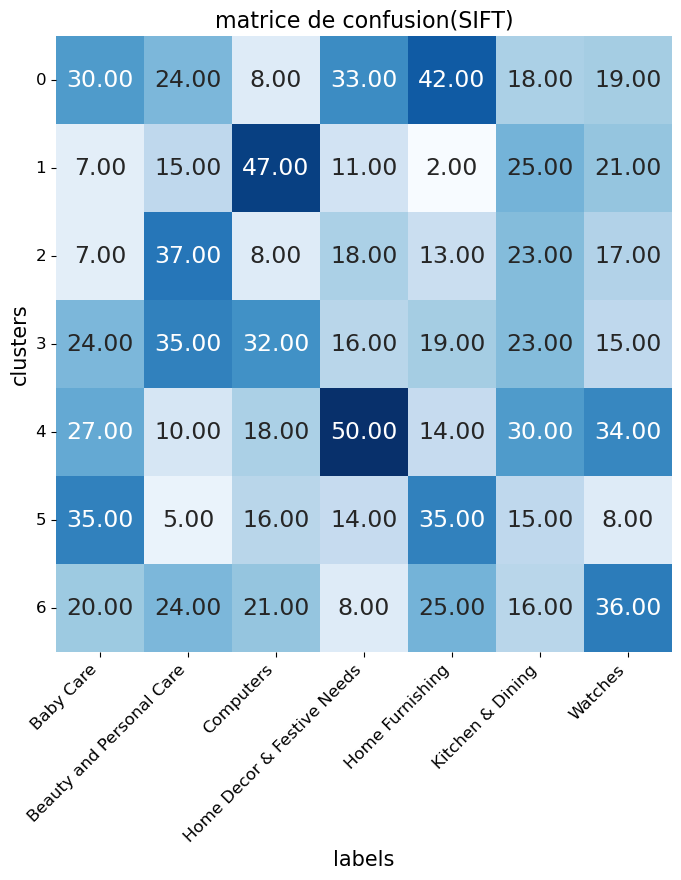

In [35]:
confusion_matrix(df_tsne_img["class"], df_tsne_img["cluster"], 'matrice de confusion(SIFT)')

## Faisabilité de classification automatique d’images via CNN Transfer Learning

Dans cette partie, nous allons utiliser la bibliothèque Keras pour mettre en œuvre le Deep Learning. Nous utiliserons spécifiquement une version du réseau de neurones convolutif appelée VGG-Net, connue sous le nom de VGG16.

Il convient de noter que Keras nous offre la possibilité d'utiliser une version pré-entraînée de VGG16.

VGG16 est une variante du réseau de neurones convolutif VGG-Net. Il est composé de 16 couches au total, comprenant 13 couches de convolution et 3 couches fully-connected. Le modèle doit donc apprendre les poids de ces 16 couches.

Le réseau VGG16 est conçu pour traiter des images en couleurs de taille 224 × 224 pixels et les classifier dans l'une des 1000 classes prédéfinies. En conséquence, il renvoie un vecteur de taille 1000, contenant les probabilités d'appartenance à chaque classe.

Le Transfer Learning consiste à utiliser le modèle VGG16 pré-entraîné sur ImageNet. ImageNet est un projet de recherche visant à constituer une vaste base de données d'images annotées, c'est-à-dire des images accompagnées de descriptions.

Le processus de mise en œuvre du Transfer Learning comprend trois étapes :

- ÉTAPE 1 - Chargement des images et extraction des caractéristiques : Chaque image est prétraitée pour être conforme à l'entrée acceptée par le modèle de Transfer Learning. En utilisant les poids du modèle de Transfer Learning, l'image est convertie en un vecteur correspondant. Ensuite, tous les vecteurs de poids des images sont aplatis et stockés dans une liste.

- ÉTAPE 2 - Réduction de dimension : Cette étape vise à réduire la dimensionnalité des données extraites afin de faciliter le traitement ultérieur.

- ÉTAPE 3 - Clustering : Dans cette étape, les données sont regroupées en clusters, ce qui permet d'identifier des structures ou des similarités entre les images en fonction de leurs caractéristiques extraites

 #### Création du modèle d'étude avec VGG16

- Chargement des images, extraction des features

In [36]:
# Utilisation de VGG16 pré-entraîné sur ImageNet avec les images d'origine

# Liste
vgg16_all_features = []

# Instanciation du modèle
model_vgg16 = VGG16()

# Remove the output layer
model_vgg16= Model(inputs=model_vgg16.inputs, outputs=model_vgg16.layers[-2].output)

# Résumé de l'architecture du modèle
model_vgg16.summary()

for rep_image in df_img['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    
    img = load_img(rep_image, target_size=(224, 224))
    
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    
    img = img_to_array(img)
    
    # Redimensionnement
    
    img = np.expand_dims(img, axis=0)
    
    # Préparer de nouvelles entrées pour le réseau.
    
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    
    vgg16_feature = model_vgg16.predict(img)
    
    # Ajouter la feature prédite en nparray à la liste
    vgg16_all_features.append(np.array(vgg16_feature).flatten())

vgg16_all_features = np.array(vgg16_all_features)

2023-05-29 12:37:03.497720: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

1/1 [==============================] - 0s 221ms/step


1/1 [==============================] - 0s 221ms/step


/Users/sbeddyy/anaconda3/envs/Projet6/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


1/1 [==============================] - 0s 223ms/step


1/1 [==============================] - 0s 278ms/step


In [37]:
# Dataframe de sauvegarde des BOVW VGG16
# Association des features à chaque image
df_img['vgg16_bovw'] = [vgg16_all_features[i] for i in range(df_img.shape[0])]
# Dataframe de travail
df_vgg16_bovw = df_img[['image', 'image_loc', 'categ_1', 'vgg16_bovw']]
# Constituer le dataframe de vecteurs de BOVW VGG16
df_vgg16_vectors = pd.DataFrame.from_records(vgg16_all_features)

#### Réduction de dimension

- PCA

In [38]:
print("Dimensions dataset avant réduction PCA : ", df_vgg16_vectors.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_vgg16 = pca.fit_transform(df_vgg16_vectors)
print("Dimensions dataset après réduction PCA : ", pca_results_vgg16.shape)

Dimensions dataset avant réduction PCA :  (1050, 4096)
Dimensions dataset après réduction PCA :  (1050, 803)


- T-SNE et affichage des images selon vraies classes

In [39]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_vgg16 = tsne.fit_transform(pca_results_vgg16)

df_tsne_vgg16 = pd.DataFrame(tsne_results_vgg16[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_vgg16["class"] =df_img["categ_1"]
print(df_tsne_vgg16.shape)

(1050, 3)


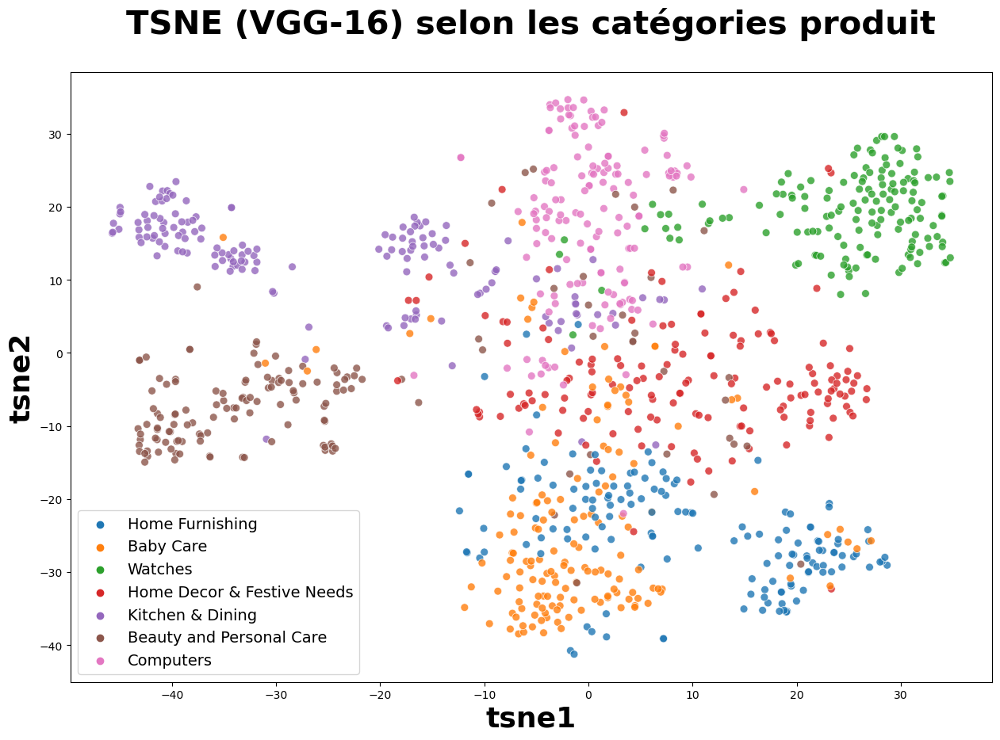

In [40]:
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_vgg16, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (VGG-16) selon les catégories produit', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

#### Création de clusters à partir du T-SNE et affichage des images selon clusters

In [41]:
#Création de clusters à partir du T-SNE 
X = df_tsne_vgg16[["tsne1","tsne2"]]

cls = KMeans(n_clusters=7, init='k-means++', random_state=0)
cls.fit(X)

df_tsne_vgg16["cluster"] = cls.labels_

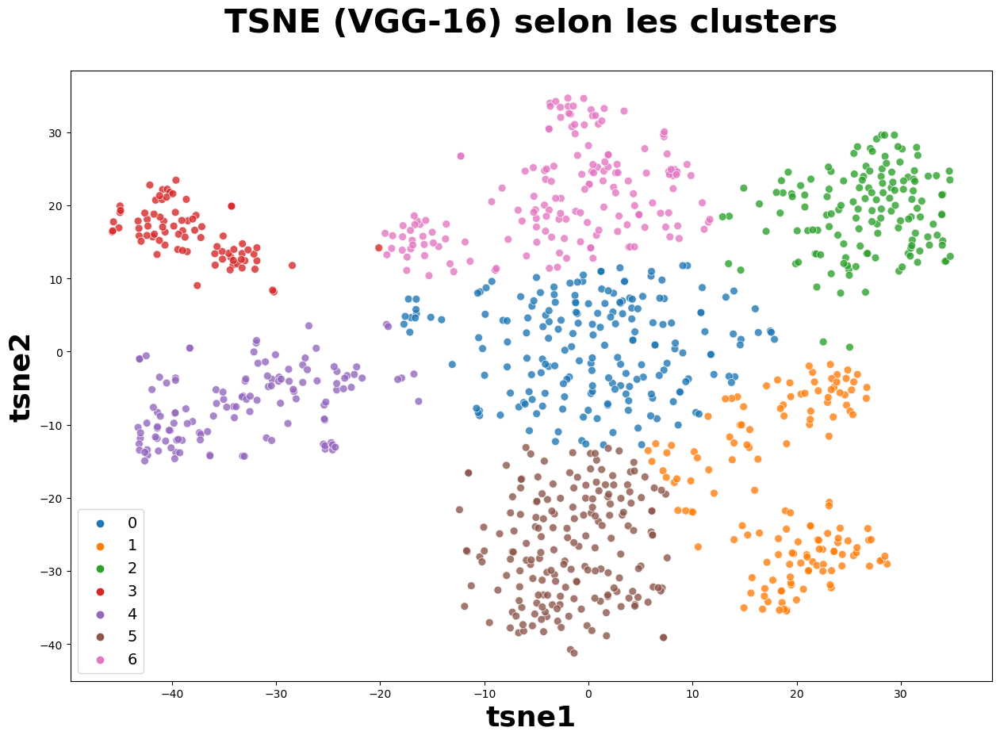

ARI :  0.45608868272878733


In [42]:
#Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_vgg16,
    legend="brief")

plt.title('TSNE (VGG-16) selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = df_img["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

#### la matrice de confusion

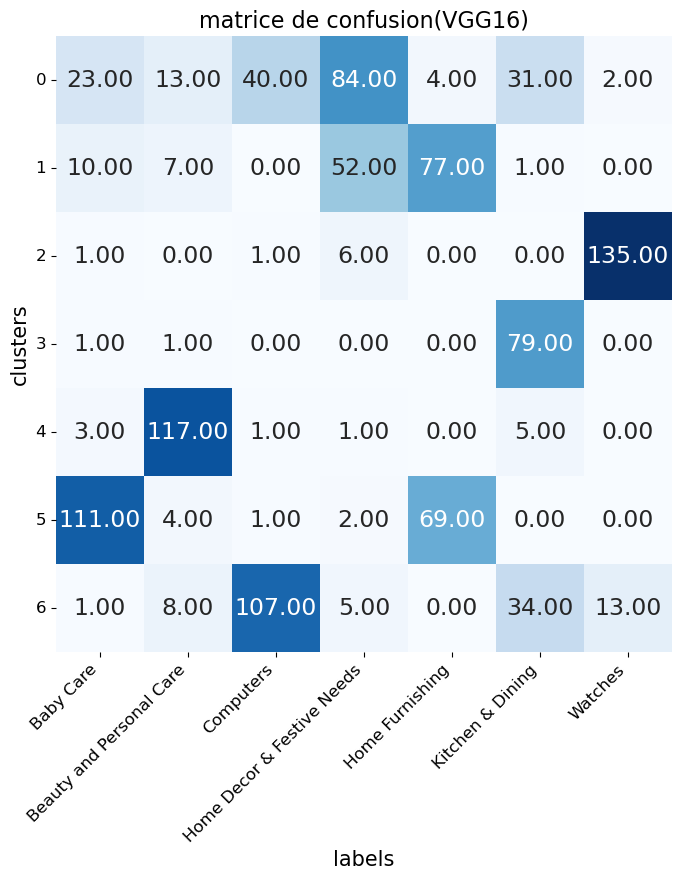

In [43]:
confusion_matrix(df_tsne_vgg16["class"], df_tsne_vgg16["cluster"], 'matrice de confusion(VGG16)')

### Conclusion 

In [44]:
result = {'modèle': ['BOW', 'TF-IDF', 'Word2Vec', 'BERT', 'USE', 'SIFT', 'CNN'],
        'ARI': [0.10, 0.28, 0.31, 0.18, 0.39, 0.034, 0.45]}

Re = pd.DataFrame(result)

print(Re)

     modèle    ARI
0       BOW  0.100
1    TF-IDF  0.280
2  Word2Vec  0.310
3      BERT  0.180
4       USE  0.390
5      SIFT  0.034
6       CNN  0.450


Le modèle VGG-16 a produit des résultats supérieurs au modèle SIFT.

L'analyse des résultats du clustering indique que l'utilisation des données textuelles est plus réalisable et donne des résultats satisfaisants pour le moteur de classification, tandis que l'utilisation des données visuelles présente des limitations en termes de performance.

## Classification supervisée

#####  Création du modèle de classification

In [45]:
def create_model_fct() :
    # Récupération modèle pré-entraîné
    model0 = VGG16(include_top=False, weights="imagenet", input_shape=(224, 224, 3))

    # Layer non entraînables = on garde les poids du modèle pré-entraîné
    for layer in model0.layers:
        layer.trainable = False

    # Récupérer la sortie de ce réseau
    x = model0.output
    # Compléter le modèle
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.5)(x)
    predictions = Dense(7, activation='softmax')(x)

    # Définir le nouveau modèle
    model = Model(inputs=model0.input, outputs=predictions)
    # compilation du modèle 
    model.compile(loss="categorical_crossentropy", optimizer='rmsprop', metrics=["accuracy"])

    print(model.summary())
    
    return model

##### Approche préparation initiale des images

In [47]:
def image_prep_fct(data) :
    prepared_images = []
    for image_num in range(len(data['image_loc'])) :
        img = (load_img(
            data['image_loc'][image_num],
            target_size=(224, 224)))
        img = img_to_array(img)
        img = img.reshape((img.shape[0], img.shape[1], img.shape[2]))
        img = preprocess_input(img)
        prepared_images.append(img)
        prepared_images_np = np.array(prepared_images)
    return prepared_images_np
    
images_np = image_prep_fct(df_img)
print(images_np.shape)

(1050, 224, 224, 3)


In [48]:
from tensorflow.keras.utils import to_categorical
X = images_np
y = to_categorical(df_img['label'])

y

array([[0., 0., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [49]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y, stratify=y, test_size=0.25, random_state=42)
X_train.shape

(787, 224, 224, 3)

In [50]:
import tensorflow as tf
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalAveragePooling1D, Flatten, Dense, Dropout 
from tensorflow.keras.layers import Rescaling, RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [51]:
# Création du modèle
with tf.device('/gpu:0'): 
    model1 = create_model_fct()

# Création du callback
model1_save_path1 = "./model1_best_weights.h5"
checkpoint = ModelCheckpoint(model1_save_path1, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
callbacks_list = [checkpoint, es]

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [52]:
# Entraîner sur les données d'entraînement (X_train, y_train)
with tf.device('/gpu:0'): 
    history1 = model1.fit(X_train, y_train, epochs=50, batch_size=64, 
                       callbacks=callbacks_list, validation_data=(X_val, y_val), verbose=1)

Epoch 1/50
13/13 [==============================] - ETA: 0s - loss: 5.1799 - accuracy: 0.4600 
Epoch 1: val_loss improved from inf to 1.74858, saving model to ./model1_best_weights.h5
13/13 [==============================] - 175s 14s/step - loss: 5.1799 - accuracy: 0.4600 - val_loss: 1.7486 - val_accuracy: 0.7186
Epoch 2/50
13/13 [==============================] - ETA: 0s - loss: 1.9833 - accuracy: 0.6912 
Epoch 2: val_loss improved from 1.74858 to 1.21012, saving model to ./model1_best_weights.h5
13/13 [==============================] - 172s 13s/step - loss: 1.9833 - accuracy: 0.6912 - val_loss: 1.2101 - val_accuracy: 0.7605
Epoch 3/50
13/13 [==============================] - ETA: 0s - loss: 1.2674 - accuracy: 0.7548 
Epoch 3: val_loss improved from 1.21012 to 1.07843, saving model to ./model1_best_weights.h5
13/13 [==============================] - 176s 14s/step - loss: 1.2674 - accuracy: 0.7548 - val_loss: 1.0784 - val_accuracy: 0.7605
Epoch 4/50
13/13 [=============================

In [53]:
# Score du dernier epoch

loss, accuracy = model1.evaluate(X_train, y_train, verbose=True)
print("Training Accuracy: {:.4f}".format(accuracy))
print()
loss, accuracy = model1.evaluate(X_val, y_val, verbose=True)
print("Validation Accuracy:  {:.3f}".format(accuracy))

25/25 [==============================] - 127s 5s/step - loss: 0.0055 - accuracy: 0.9987
Training Accuracy: 0.9987

9/9 [==============================] - 43s 5s/step - loss: 0.9296 - accuracy: 0.8251
Validation Accuracy:  0.825


In [54]:
# Score de l'epoch optimal

model1.load_weights(model1_save_path1)

loss, accuracy = model1.evaluate(X_val, y_val, verbose=False)
print("Validation Accuracy :  {:.3f}".format(accuracy))

Validation Accuracy :  0.833


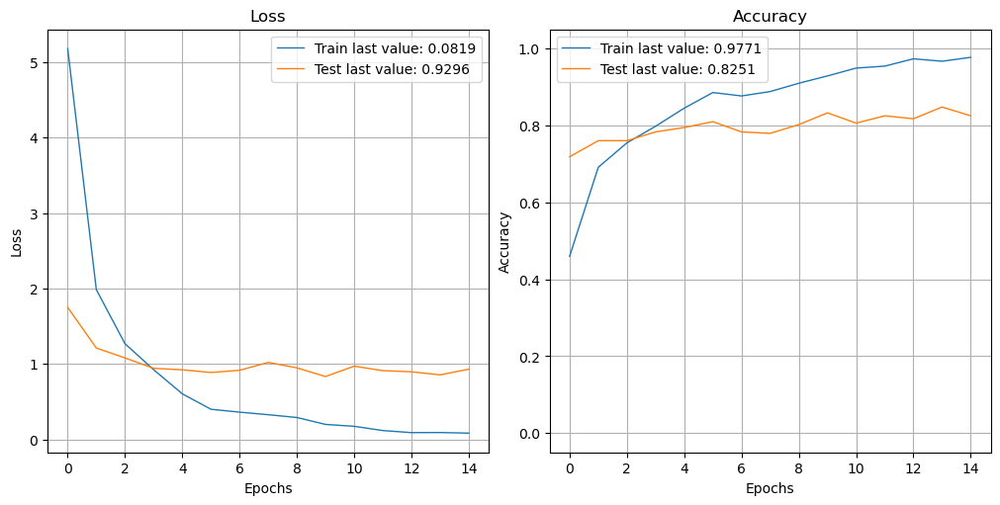

In [55]:
from plot_keras_history import show_history, plot_history
import matplotlib.pyplot as plt

show_history(history1)
plot_history(history1, path="standard.png")
plt.close()

In [56]:
y_val_num = np.argmax(y_val, axis=1)
y_val_pred = np.argmax(model1.predict(X_val), axis=1)
y_val_num = np.argmax(y_val, axis=1)
print(y_val_num)
print()
print(y_val_pred)

9/9 [==============================] - 43s 5s/step
[3 3 1 4 3 1 5 0 3 0 0 4 6 5 0 6 5 0 2 6 2 2 1 0 4 5 4 6 2 2 0 2 1 3 2 0 4
 0 0 1 6 6 1 1 4 4 0 6 2 3 1 2 3 6 1 4 6 1 4 0 1 6 5 1 0 6 5 3 6 0 3 4 0 0
 4 2 4 4 6 3 1 4 5 5 1 2 1 0 3 5 5 2 3 1 6 3 6 5 5 1 5 4 2 4 0 0 0 6 4 6 5
 0 4 5 5 6 1 4 2 1 4 0 3 3 2 3 4 2 0 3 3 0 5 1 3 3 1 5 0 1 0 3 5 2 0 1 5 6
 1 2 6 0 2 1 1 0 3 3 4 3 1 2 5 5 3 5 1 2 4 3 1 2 5 5 2 2 0 0 3 6 0 4 4 1 4
 4 1 3 6 3 6 5 2 5 0 2 2 1 6 2 0 6 4 3 3 5 3 4 1 4 0 5 5 5 2 5 6 3 6 4 6 2
 5 4 1 4 6 6 4 1 3 6 5 6 3 6 3 2 3 2 5 6 0 2 4 5 0 4 3 0 2 4 4 2 2 5 2 6 1
 6 6 2 1]

[3 4 1 4 3 1 5 0 3 0 0 4 6 2 5 6 5 3 2 6 2 2 1 0 4 5 4 6 2 2 0 2 1 3 2 0 4
 0 0 5 6 6 1 5 0 4 0 6 2 3 1 3 3 6 3 4 6 1 4 0 2 6 5 1 3 6 5 3 6 0 3 4 4 0
 4 2 0 0 6 3 1 4 5 5 1 2 1 0 3 5 5 3 0 1 6 3 6 5 5 1 5 4 2 3 4 0 0 6 4 6 5
 0 4 5 5 6 1 4 1 1 4 0 3 3 2 3 4 2 1 3 0 5 5 1 3 3 1 5 3 3 0 3 5 2 4 1 5 6
 1 2 6 0 2 1 1 4 3 3 4 3 5 2 5 2 4 5 1 2 4 0 1 2 5 5 2 2 4 0 5 6 0 4 4 1 0
 4 1 3 6 3 6 5 2 4 4 5 2 1 2 2 0 6 4 3

In [57]:
conf_mat = metrics.confusion_matrix(y_val_num, y_val_pred)
print(conf_mat)

[[25  1  1  3  6  2  0]
 [ 0 30  2  2  0  3  0]
 [ 0  1 34  2  0  1  0]
 [ 3  0  0 32  2  1  0]
 [ 6  0  0  1 31  0  0]
 [ 0  0  2  1  1 33  0]
 [ 0  0  2  0  0  1 34]]


In [58]:
def conf_mat_transform(y_true,y_pred) :
    conf_mat = metrics.confusion_matrix(y_true,y_pred)
    
    corresp = np.argmax(conf_mat, axis=0)
    print ("Correspondance des clusters : ", corresp)
    # y_pred_transform = np.apply_along_axis(correspond_fct, 1, y_pred)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x : corresp[x]) 
    
    return labels['y_pred_transform']

In [59]:
y_val_pred_transform = conf_mat_transform(y_val_num, y_val_pred)
conf_mat = metrics.confusion_matrix(y_val_num, y_val_pred_transform)
print(conf_mat)
print()
print(metrics.classification_report(y_val_num, y_val_pred_transform))

Correspondance des clusters :  [0 1 2 3 4 5 6]
[[25  1  1  3  6  2  0]
 [ 0 30  2  2  0  3  0]
 [ 0  1 34  2  0  1  0]
 [ 3  0  0 32  2  1  0]
 [ 6  0  0  1 31  0  0]
 [ 0  0  2  1  1 33  0]
 [ 0  0  2  0  0  1 34]]

              precision    recall  f1-score   support

           0       0.74      0.66      0.69        38
           1       0.94      0.81      0.87        37
           2       0.83      0.89      0.86        38
           3       0.78      0.84      0.81        38
           4       0.78      0.82      0.79        38
           5       0.80      0.89      0.85        37
           6       1.00      0.92      0.96        37

    accuracy                           0.83       263
   macro avg       0.84      0.83      0.83       263
weighted avg       0.84      0.83      0.83       263



Shape de conf_mat : (7, 7)
Taille des indices : 7 7


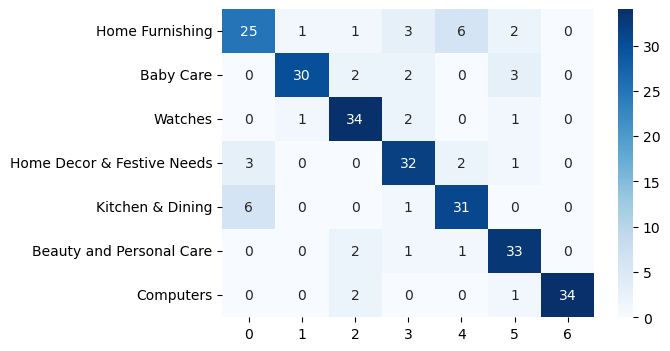

In [60]:
# Vérifier la taille de la matrice conf_mat
print("Shape de conf_mat :", conf_mat.shape)  # Assurez-vous que les dimensions sont correctes

# Récupérer les labels et les colonnes pour les indices
list_labels = df_img["categ_1"].unique()
list_columns = [str(i) for i in range(7)]

# Vérifier la taille des indices
print("Taille des indices :", len(list_labels), len(list_columns))

# Créer la DataFrame en ajustant les indices si nécessaire
if conf_mat.shape[0] == len(list_labels) and conf_mat.shape[1] == len(list_columns):
    df_cm = pd.DataFrame(conf_mat, index=list_labels, columns=list_columns)
else:
    print("Les dimensions de conf_mat ne correspondent pas aux indices spécifiés.")

# Afficher la DataFrame si elle a été créée avec succès
if 'df_cm' in locals():
    plt.figure(figsize=(6, 4))
    sns.heatmap(df_cm, annot=True, cmap="Blues")
    plt.show()
else:
    print("Impossible de créer la DataFrame. Veuillez vérifier les dimensions de conf_mat et les indices spécifiés.")

##### Approche ImageDatagenerator avec data augmentation

In [61]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [62]:
# Pour mélanger les images, classées initalement par classe
data = df_img.sample(frac=1, random_state=42).reset_index(drop=True)

In [63]:
list_labels = data["categ_1"].unique()
label_no_name = "no_name"

In [64]:
def photo_class(photo) :
    for label in list_labels :
        if label in photo[24:] : 
            return label
    return label_no_name

data["label_name"] = data["categ_1"]
batch_size = 32

def data_flow_fct(data, datagen, data_type=None) :
    data_flow = datagen.flow_from_dataframe(data, directory='',
                                x_col='image_loc', y_col='label_name',
                                weight_col=None, target_size=(256, 256),
                                classes=None, class_mode='categorical',
                                batch_size=batch_size, shuffle=True, seed=42,
                                subset=data_type
                                )
    return data_flow

In [65]:
datagen_train = ImageDataGenerator(
#    featurewise_center=True,
#    featurewise_std_normalization=True,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    validation_split=0.25,
    preprocessing_function=preprocess_input)

train_flow = data_flow_fct(data, datagen_train, data_type='training')
val_flow = data_flow_fct(data, datagen_train, data_type='validation')

# compute quantities required for featurewise normalization
# (std, mean, and principal components if ZCA whitening is applied)
# datagen.fit(X_train)
# fits the model on batches with real-time data augmentation:

Found 788 validated image filenames belonging to 7 classes.
Found 262 validated image filenames belonging to 7 classes.


In [66]:
# Création du modèle
with tf.device('/gpu:0'): 
    model2 = create_model_fct()

# Création du callback
model2_save_path = "./model2_best_weights.h5"
checkpoint = ModelCheckpoint(model2_save_path, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
callbacks_list = [checkpoint, es]

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [67]:
with tf.device('/gpu:0'): 
    history2 = model2.fit(train_flow,
                    validation_data=val_flow,
                    batch_size=batch_size, epochs=50, callbacks=callbacks_list, verbose=1)

Epoch 1/50
25/25 [==============================] - ETA: 0s - loss: 3.7452 - accuracy: 0.4822

/Users/sbeddyy/anaconda3/envs/Projet6/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(



Epoch 1: val_loss improved from inf to 0.88327, saving model to ./model2_best_weights.h5
25/25 [==============================] - 228s 9s/step - loss: 3.7452 - accuracy: 0.4822 - val_loss: 0.8833 - val_accuracy: 0.7481
Epoch 2/50
25/25 [==============================] - ETA: 0s - loss: 1.5186 - accuracy: 0.6751
Epoch 2: val_loss improved from 0.88327 to 0.71642, saving model to ./model2_best_weights.h5
25/25 [==============================] - 229s 9s/step - loss: 1.5186 - accuracy: 0.6751 - val_loss: 0.7164 - val_accuracy: 0.7786
Epoch 3/50
25/25 [==============================] - ETA: 0s - loss: 0.9709 - accuracy: 0.7449
Epoch 3: val_loss did not improve from 0.71642
25/25 [==============================] - 230s 9s/step - loss: 0.9709 - accuracy: 0.7449 - val_loss: 0.7459 - val_accuracy: 0.7748
Epoch 4/50
25/25 [==============================] - ETA: 0s - loss: 0.8129 - accuracy: 0.7665
Epoch 4: val_loss improved from 0.71642 to 0.61866, saving model to ./model2_best_weights.h5
25/25

In [68]:
# Score du dernier epoch

loss, accuracy = model2.evaluate(train_flow, verbose=True)
print("Training Accuracy   : {:.4f}".format(accuracy))
print()
loss, accuracy = model2.evaluate(val_flow, verbose=True)
print("Validation Accuracy :  {:.4f}".format(accuracy))

25/25 [==============================] - 170s 7s/step - loss: 0.1045 - accuracy: 0.9683
Training Accuracy   : 0.9683

9/9 [==============================] - 57s 6s/step - loss: 0.6746 - accuracy: 0.8168
Validation Accuracy :  0.8168


In [69]:
# Score de l'epoch optimal

model2.load_weights(model2_save_path)

loss, accuracy = model2.evaluate(val_flow, verbose=False)
print("Validation Accuracy :  {:.4f}".format(accuracy))

Validation Accuracy :  0.8244


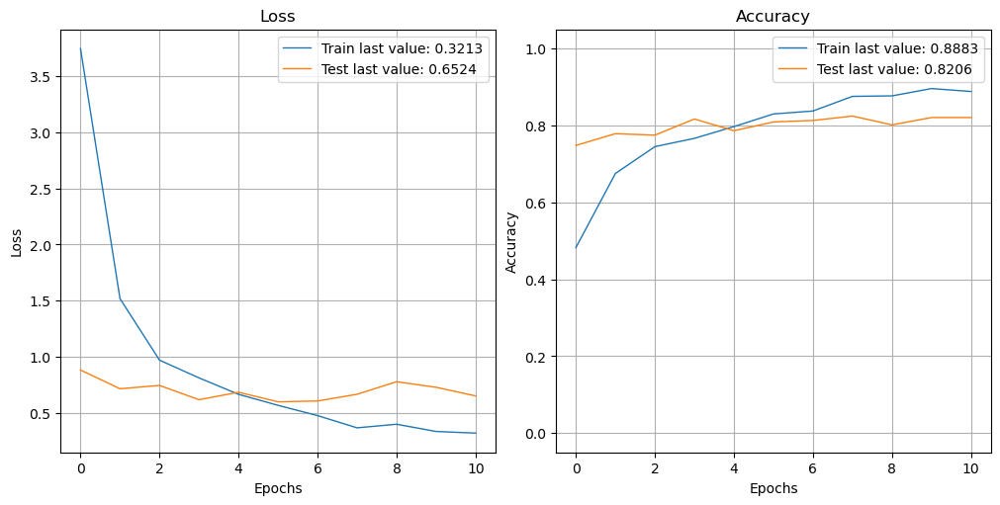

In [70]:
from plot_keras_history import show_history, plot_history
import matplotlib.pyplot as plt

show_history(history2)
plot_history(history2, path="standard.png")
plt.close()